In [3]:
import os
from PIL import Image
import numpy as np

path = "data/OxfordIIITPet/oxford-iiit-pet/images"
widths = []
heights = []

n_images = 0
for filename in os.listdir(path):
    if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
        with Image.open(os.path.join(path, filename)) as img:
            n_images = n_images + 1
            width, height = img.size
            widths.append(width)
            heights.append(height)

widths = np.array(widths)
heights = np.array(heights)

max_width = np.max(widths)
min_width = np.min(widths)
mean_width = np.mean(widths)

max_height = np.max(heights)
min_height = np.min(heights)
mean_height = np.mean(heights)

print(f'Max Width: {max_width}, Min Width: {min_width}, Mean Width: {mean_width:.2f}')
print(f'Max Height: {max_height}, Min Height: {min_height}, Mean Height: {mean_height:.2f}')
print(f"{n_images} have been analyzed")

Max Width: 3264, Min Width: 114, Mean Width: 436.75
Max Height: 2606, Min Height: 103, Mean Height: 390.91
7390 have been analyzed


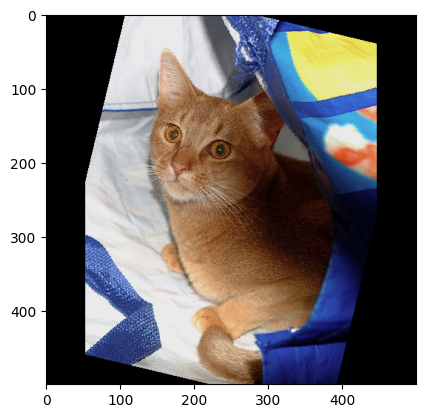

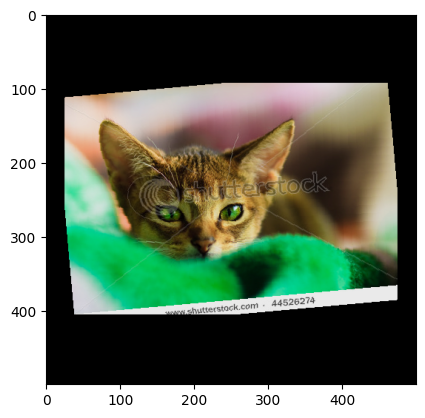

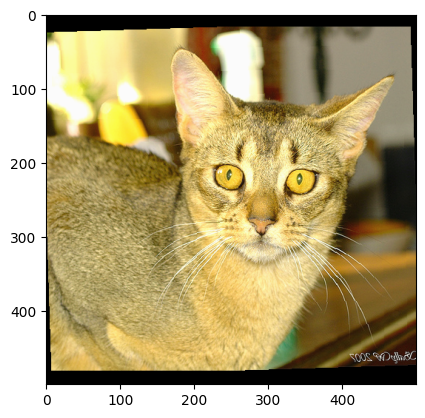

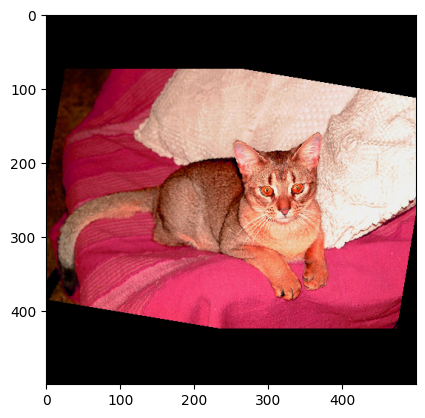

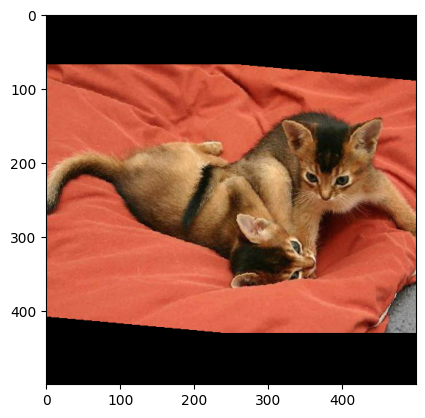

...

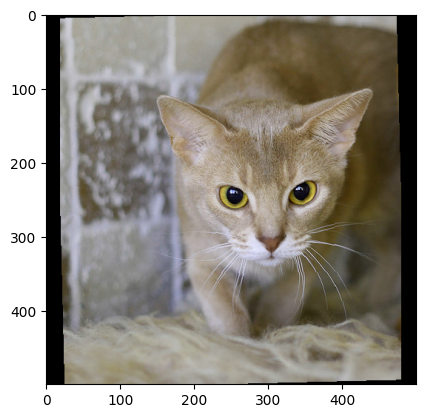

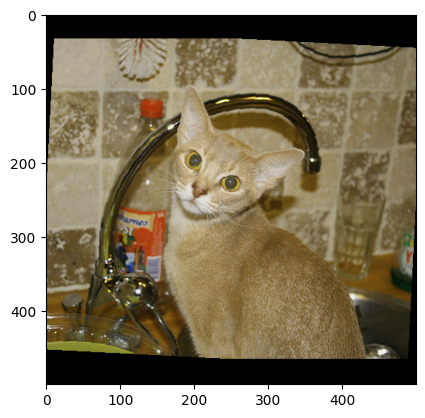

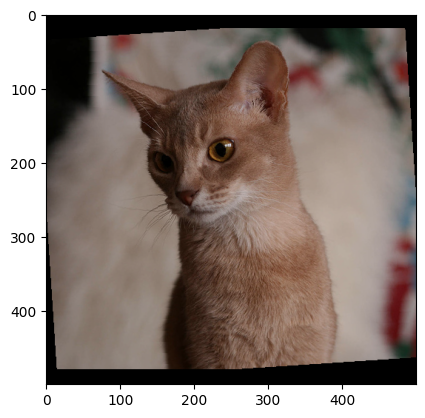

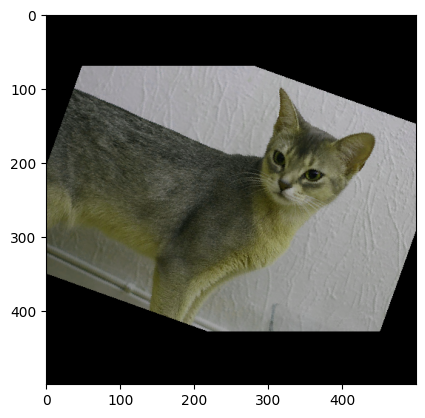

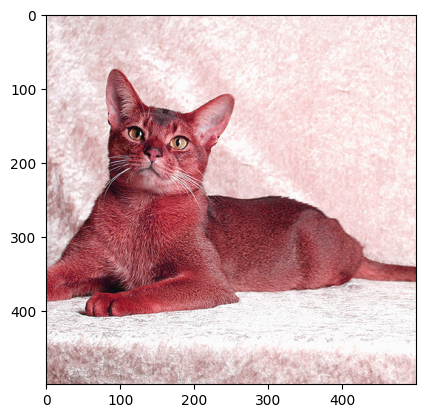

In [8]:
from torchvision.transforms import transforms
import skimage
import torchvision
import matplotlib.pyplot as plt

img_size = 500

transform = torchvision.transforms.Compose(
    [transforms.ToTensor(), transforms.RandomHorizontalFlip(p=0.5),
     transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
     transforms.RandomGrayscale(p=0.05), torchvision.transforms.RandomRotation(degrees=20),
     torchvision.transforms.CenterCrop(img_size)])
data_train = torchvision.datasets.OxfordIIITPet(root='data/OxfordIIITPet', download=True, transform=transform)
data_test = torchvision.datasets.OxfordIIITPet(root='data/OxfordIIITPet', split='test', download=True,
                                               transform=transform)

train_iter = iter(data_train)
for i in range(50):
    image, labels = next(train_iter)
    image = image.numpy().squeeze().transpose((1, 2, 0))
    plt.imshow(image)
    plt.show()